In this notebook we assess the performance of two trained models from our group, one provided by Wang & Lin and the Easy-to-use_TFM-package from our group (https://github.com/CellMicroMechanics/Easy-to-use_TFM_package). We use samples of artificial generic test cells, experimental NIH 3T3 cells and artifical circular traction spots.

## Imports

In [1]:
from scripts.tracNet import TracNet
from scripts.data_preparation import matFiles_to_npArray, reshape
from scripts.training_and_evaluation import test, predictTrac
from scripts.data_visualization import plotCell

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

from IPython.display import Image
from shapely.geometry import Point, Polygon
from scipy.io import loadmat, savemat
from scipy.interpolate import interp2d

Set seeds for reproducability.

In [2]:
random_seed = 2
np.random.seed(random_seed)
torch.manual_seed(random_seed)

The test sets are of small size, so no CUDA support is needed.

In [3]:
device = torch.device('cpu')

Load one model trained with SGD (best validation RMSE: 2.601) and one trained with ADAM (best validation RMSE: 1.537)

In [4]:
model_SGD = TracNet(n_channels=1).double().to(device)
model_SGD.load_state_dict(torch.load('models/TracNet104_best_val_rmse_2.601_SGD.pth'), strict=False)

<All keys matched successfully>

In [5]:
model_ADAM = TracNet(n_channels=1).double().to(device)
model_ADAM.load_state_dict(torch.load('models/TracNet104_best_val_rmse_1.537_ADAM.pth'), strict=False)

<All keys matched successfully>

## Evaluation

### 1. Artificial test data from Wang & Lin

We test the three models on 17 artificial cells with shapes of generic amoeboid or mesenchymal cells. 

In [6]:
X_test = matFiles_to_npArray('data/test/generic/testData104/dspl') # each dict has keys ['brdx', 'brdy', 'dspl', 'name']
y_test = matFiles_to_npArray('data/test/generic/testData104/trac') # each dict has keys ['brdx', 'brdy', 'trac', 'name']

Calculate loss for both models. Young's modulus for hypothetical substrate is 10670 Pa.

In [7]:
losses_SGD = test(X_test, y_test, model_SGD, 10670, plot=False)
losses_ADAM = test(X_test, y_test, model_ADAM, 10670, plot=False)

/usr/local/lib/python3.9/site-packages/torch/nn/modules/conv.py:585: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at  ../aten/src/ATen/native/Convolution.cpp:647.)
  return F.conv3d(


Compare the losses. The model of Wang & Lin is evaluated on the same data in MATLAB and the results are shown below.

In [8]:
pd.set_option('display.width', 1000)
pd.set_option('display.colheader_justify', 'center')
pd.set_option('display.precision', 3)

In [10]:
df = pd.read_csv("comparables/01/TError.csv", usecols= ["File ID", "104"])
df = df.assign(error_Matlab_SGD=[tensor.item() for tensor in dict(sorted(losses_SGD.items())).values()])
df = df.assign(error_Matlab_ADAM=[tensor.item() for tensor in dict(sorted(losses_ADAM.items())).values()])
df = df.rename(columns = {"104":"TracNet_SGD_Wang & Lin loss", "error_Matlab_SGD":"TracNet_SGD_Richard & Sabaß loss", "error_Matlab_ADAM":"TracNet_ADAM_Richard & Sabaß loss"}).round(decimals=4)
df = df.append({'File ID':'', 'TracNet_SGD_Wang & Lin loss': f"avg: {round(df['TracNet_SGD_Wang & Lin loss'].mean(), ndigits=4)}", 'TracNet_SGD_Richard & Sabaß loss': f"avg: {round(df['TracNet_SGD_Richard & Sabaß loss'].mean(), ndigits=4)}", 'TracNet_ADAM_Richard & Sabaß loss': f"avg: {round(df['TracNet_ADAM_Richard & Sabaß loss'].mean(), ndigits=4)}"}, ignore_index=True)
df.style.set_properties(**{'text-align': 'center', 'font-size': '11pt'})

,File ID,TracNet_SGD_Wang & Lin loss,TracNet_SGD_Richard & Sabaß loss,TracNet_ADAM_Richard & Sabaß loss
0,#0018,0.114,0.187,0.113
1,#0022,0.123,0.265,0.155
2,#0023,0.102,0.192,0.107
3,#0024,0.115,0.254,0.110
4,#0025,0.114,0.205,0.105
5,#0027,0.117,0.254,0.119
6,#0030,0.101,0.194,0.110
7,#0034,0.128,0.200,0.118
8,#0037,0.102,0.185,0.101
9,#0038,0.110,0.220,0.122


Visualize the displacement field of one cell both as strain vector field and strain heat map.

<IPython.core.display.Javascript object>


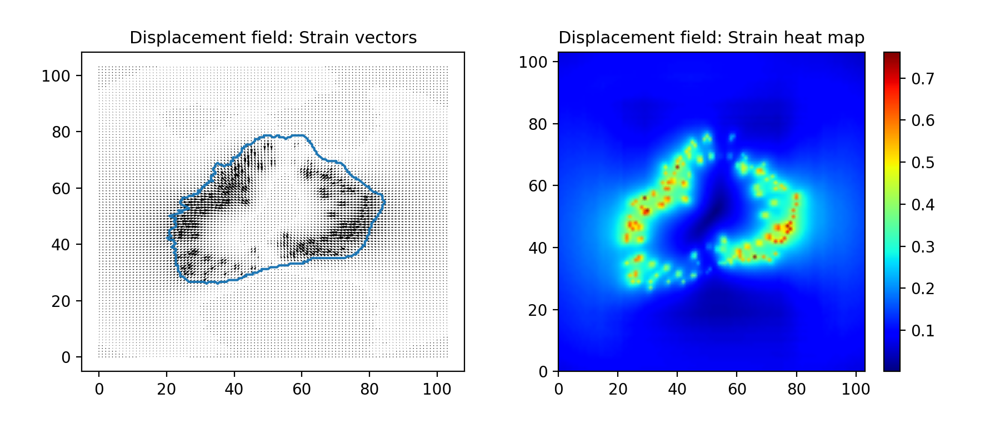

Text(0.5, 1.0, 'Displacement field: Strain heat map')

In [11]:
get_ipython().run_line_magic('matplotlib', 'notebook')

fig, axs = plt.subplots(1,2, figsize=(9, 4))
fig.tight_layout(pad=3, w_pad=3, h_pad=3)
axs[0].quiver(X_test[12]['dspl'][:,:,0].T, X_test[12]['dspl'][:,:,1].T, scale=35)
axs[0].set_title('Displacement field: Strain vectors', {'fontsize': 11})
axs[0].plot(X_test[12]['brdx'][0], X_test[12]['brdy'][0])

C = np.sqrt(X_test[12]['dspl'][:,:,0].T ** 2 + X_test[12]['dspl'][:,:,1].T ** 2)
im = axs[1].pcolormesh(C, cmap='jet', shading='gouraud')
fig.colorbar(im, ax=axs[1])
axs[1].pcolormesh(C, cmap='jet', shading='gouraud')
axs[1].set_title('Displacement field: Strain heat map', {'fontsize': 11})

Visualize the respective predictions of the models both as quiver plots and heatmaps.

In [12]:
predictions = {}
predictions['TracNet_SGD_Matlab'] = loadmat('comparables/01/Tracnet_SGD_Matlab.mat')
predictions['TracNet_SGD_Python'] = np.moveaxis(predictTrac(torch.from_numpy(reshape(X_test[12]['dspl'][np.newaxis, :])), model_SGD, E=10670).detach().numpy()[0][0], [0,2], [2,0])
predictions['TracNet_ADAM_Python'] = np.moveaxis(predictTrac(torch.from_numpy(reshape(X_test[12]['dspl'][np.newaxis, :])), model_ADAM, E=10670).detach().numpy()[0][0], [0,2], [2,0])

<IPython.core.display.Javascript object>


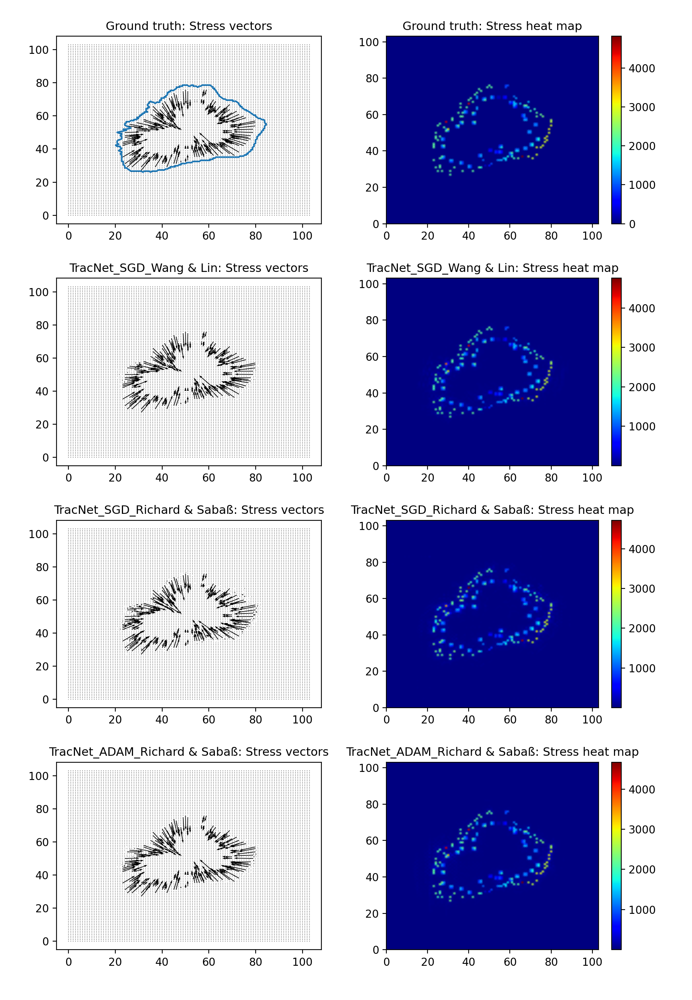

In [13]:
get_ipython().run_line_magic('matplotlib', 'notebook')

fig, axs = plt.subplots(4, 2, figsize=(9, 13))
fig.tight_layout(pad=3, w_pad=3, h_pad=3)

axs[0, 0].quiver(y_test[12]['trac'][:,:,0].T, y_test[12]['trac'][:,:,1].T, scale=40000)
axs[0, 0].set_title('Ground truth: Stress vectors', {'fontsize': 11})
axs[0, 0].plot(y_test[12]['brdx'][0], y_test[12]['brdy'][0])

C = np.sqrt(y_test[12]['trac'][:,:,0].T ** 2 + y_test[12]['trac'][:,:,1].T ** 2)
im = axs[0,1].pcolormesh(C, cmap='jet', shading='gouraud')
fig.colorbar(im, ax=axs[0,1])
axs[0,1].pcolormesh(C, cmap='jet', shading='gouraud')
axs[0,1].set_title('Ground truth: Stress heat map', {'fontsize': 11})

axs[1, 0].quiver(predictions['TracNet_SGD_Matlab']['matlab_pred'][:,:,0].T, predictions['TracNet_SGD_Matlab']['matlab_pred'][:,:,1].T, scale=40000)
axs[1, 0].set_title('TracNet_SGD_Wang & Lin: Stress vectors', {'fontsize': 11})

C = np.sqrt(predictions['TracNet_SGD_Matlab']['matlab_pred'][:,:,0].T ** 2 + predictions['TracNet_SGD_Matlab']['matlab_pred'][:,:,1].T ** 2)
im = axs[1,1].pcolormesh(C, cmap='jet', shading='gouraud')
fig.colorbar(im, ax=axs[1,1])
axs[1,1].pcolormesh(C, cmap='jet', shading='gouraud')
axs[1,1].set_title('TracNet_SGD_Wang & Lin: Stress heat map', {'fontsize': 11})

axs[2, 0].quiver(predictions['TracNet_SGD_Python'][:,:,0].T, predictions['TracNet_SGD_Python'][:,:,1].T, scale=40000)
axs[2, 0].set_title('TracNet_SGD_Richard & Sabaß: Stress vectors', {'fontsize': 11})

C = np.sqrt(predictions['TracNet_SGD_Python'][:,:,0].T ** 2 + predictions['TracNet_SGD_Python'][:,:,1].T ** 2)
im = axs[2,1].pcolormesh(C, cmap='jet', shading='gouraud')
fig.colorbar(im, ax=axs[2,1])
axs[2,1].pcolormesh(C, cmap='jet', shading='gouraud')
axs[2,1].set_title('TracNet_SGD_Richard & Sabaß: Stress heat map', {'fontsize': 11})

axs[3, 0].quiver(predictions['TracNet_ADAM_Python'][:,:,0].T, predictions['TracNet_ADAM_Python'][:,:,1].T, scale=40000)
axs[3, 0].set_title('TracNet_ADAM_Richard & Sabaß: Stress vectors', {'fontsize': 11})

C = np.sqrt(predictions['TracNet_ADAM_Python'][:,:,0].T ** 2 + predictions['TracNet_ADAM_Python'][:,:,1].T ** 2)
im = axs[3,1].pcolormesh(C, cmap='jet', shading='gouraud')
fig.colorbar(im, ax=axs[3,1])
axs[3,1].pcolormesh(C, cmap='jet', shading='gouraud')
axs[3,1].set_title('TracNet_ADAM_Richard & Sabaß: Stress heat map', {'fontsize': 11})


plt.show()

### 2. Experimental data from Wang & Lin

Load data.

In [14]:
experimental = matFiles_to_npArray('data/cells/dspl') # each dict has keys ['brdx', 'brdy', 'dspl', 'name']

Plot strain field for one cell.

<IPython.core.display.Javascript object>


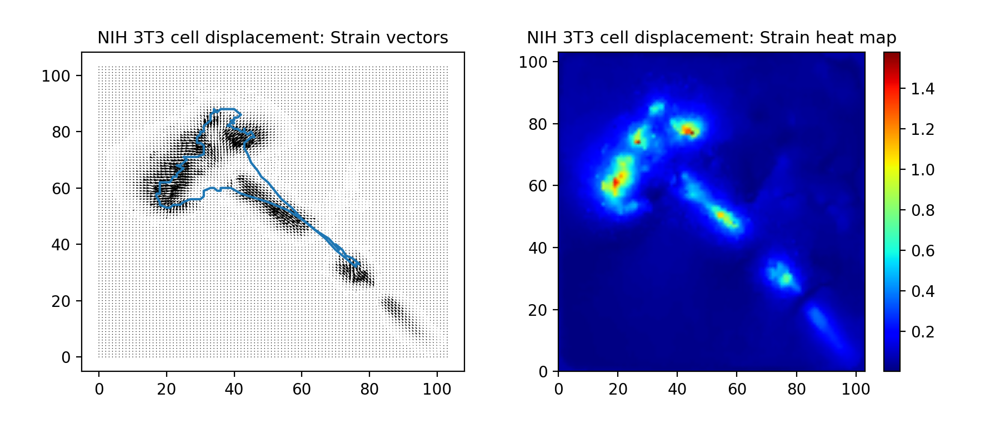

Text(0.5, 1.0, 'NIH 3T3 cell displacement: Strain heat map')

In [15]:
fig, axs = plt.subplots(1,2, figsize=(9, 4))
fig.tight_layout(pad=3, w_pad=3, h_pad=3)
axs[0].quiver(experimental[4]['dspl'][:,:,0].T, experimental[4]['dspl'][:,:,1].T, scale=35)
axs[0].set_title('NIH 3T3 cell displacement: Strain vectors', {'fontsize': 11})
axs[0].plot(experimental[4]['brdx'][0], experimental[4]['brdy'][0])

C = np.sqrt(experimental[4]['dspl'][:,:,0].T ** 2 +experimental[4]['dspl'][:,:,1].T ** 2)
im = axs[1].pcolormesh(C, cmap='jet', shading='gouraud')
fig.colorbar(im, ax=axs[1])
axs[1].pcolormesh(C, cmap='jet', shading='gouraud')
axs[1].set_title('NIH 3T3 cell displacement: Strain heat map', {'fontsize': 11})

Calculate and plot predictions for this sample. As this datapoint has been acquired experimentally, there is no ground truth available.

In [16]:
predictions = {}
predictions['TracNet_SGD_Matlab'] = loadmat('comparables/02/Exp_pred.mat')
predictions['TracNet_SGD_Python'] = np.moveaxis(predictTrac(torch.from_numpy(reshape(experimental[4]['dspl'][np.newaxis, :])), model_SGD, E=10670).detach().numpy()[0][0], [0,2], [2,0])
predictions['TracNet_ADAM_Python'] = np.moveaxis(predictTrac(torch.from_numpy(reshape(experimental[4]['dspl'][np.newaxis, :])), model_ADAM, E=10670).detach().numpy()[0][0], [0,2], [2,0])
predictions['Easy-to-use_TFM'] = loadmat('comparables/02/easy_trac_pred.mat')

<IPython.core.display.Javascript object>


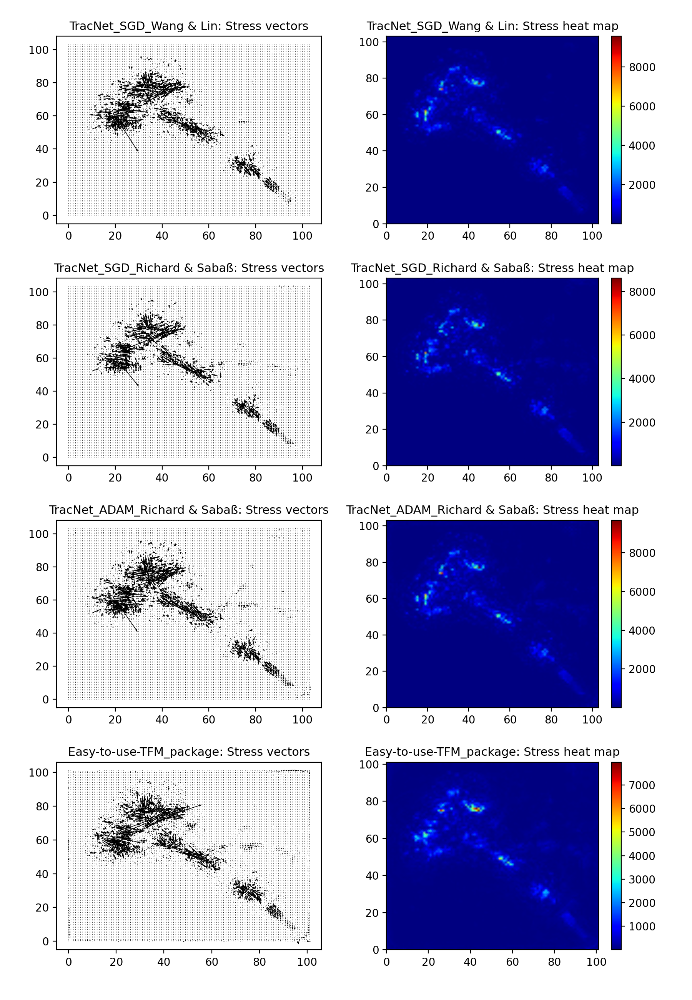

In [17]:
get_ipython().run_line_magic('matplotlib', 'notebook')

fig, axs = plt.subplots(4, 2, figsize=(9, 13))
fig.tight_layout(pad=3, w_pad=3, h_pad=3)

axs[0, 0].quiver(predictions['TracNet_SGD_Matlab']['exp_trac'][:,:,0].T, predictions['TracNet_SGD_Matlab']['exp_trac'][:,:,1].T, scale=40000)
axs[0, 0].set_title('TracNet_SGD_Wang & Lin: Stress vectors', {'fontsize': 11})

C = np.sqrt(predictions['TracNet_SGD_Matlab']['exp_trac'][:,:,0].T ** 2 + predictions['TracNet_SGD_Matlab']['exp_trac'][:,:,1].T ** 2)
im = axs[0,1].pcolormesh(C, cmap='jet', shading='gouraud')
fig.colorbar(im, ax=axs[0,1])
axs[0,1].pcolormesh(C, cmap='jet', shading='gouraud')
axs[0,1].set_title('TracNet_SGD_Wang & Lin: Stress heat map', {'fontsize': 11})

axs[1, 0].quiver(predictions['TracNet_SGD_Python'][:,:,0].T, predictions['TracNet_SGD_Python'][:,:,1].T, scale=40000)
axs[1, 0].set_title('TracNet_SGD_Richard & Sabaß: Stress vectors', {'fontsize': 11})

C = np.sqrt(predictions['TracNet_SGD_Python'][:,:,0].T ** 2 + predictions['TracNet_SGD_Python'][:,:,1].T ** 2)
im = axs[1,1].pcolormesh(C, cmap='jet', shading='gouraud')
fig.colorbar(im, ax=axs[1,1])
axs[1,1].pcolormesh(C, cmap='jet', shading='gouraud')
axs[1,1].set_title('TracNet_SGD_Richard & Sabaß: Stress heat map', {'fontsize': 11})

axs[2, 0].quiver(predictions['TracNet_ADAM_Python'][:,:,0].T, predictions['TracNet_ADAM_Python'][:,:,1].T, scale=40000)
axs[2, 0].set_title('TracNet_ADAM_Richard & Sabaß: Stress vectors', {'fontsize': 11})

C = np.sqrt(predictions['TracNet_ADAM_Python'][:,:,0].T ** 2 + predictions['TracNet_ADAM_Python'][:,:,1].T ** 2)
im = axs[2,1].pcolormesh(C, cmap='jet', shading='gouraud')
fig.colorbar(im, ax=axs[2,1])
axs[2,1].pcolormesh(C, cmap='jet', shading='gouraud')
axs[2,1].set_title('TracNet_ADAM_Richard & Sabaß: Stress heat map', {'fontsize': 11})

axs[3, 0].quiver(predictions['Easy-to-use_TFM']['easy_trac_pred_'][:,:,0].T, predictions['Easy-to-use_TFM']['easy_trac_pred_'][:,:,1].T, scale=40000)
axs[3, 0].set_title('Easy-to-use-TFM_package: Stress vectors', {'fontsize': 11})

C = np.sqrt(predictions['Easy-to-use_TFM']['easy_trac_pred_'][:,:,0].T ** 2 + predictions['Easy-to-use_TFM']['easy_trac_pred_'][:,:,1].T ** 2)
im = axs[3,1].pcolormesh(C, cmap='jet', shading='gouraud')
fig.colorbar(im, ax=axs[3,1])
axs[3,1].pcolormesh(C, cmap='jet', shading='gouraud')
axs[3,1].set_title('Easy-to-use-TFM_package: Stress heat map', {'fontsize': 11})

plt.show()

### 3. Artificial data from AG Sabaß

Now we want to assess the algorithms on artificially created data from AG Sabaß. The reference sample can be found in the 'test_data' folder in the Easy-to-use_TFM-package. We perform TFM in MATLAB using the Bayesian regularization method with the same parameters as described in the user manual.

This data point is of size 50 x 50 x 2, so it needs to be linearly interpolated and padded befor the neural networks can perform inference. We run these steps in MATLAB and present the results below.

In [297]:
results = loadmat('comparables/03/MATLAB_outputs')
dspl_pad = results['dspl_pad'] # contains the linearly interpolated and zero-padded displacement sample
pred_trac_dltfm = results['pred_trac_dltfm'] # contains Wang & Lin's TracNet prediction with E = 10000 for 'dspl_pad'
pred_trac_etutfm = results['pred_trac_etutfm'] # contains the linearly interpolated and zero-padded PREDICTION of the Bayesian regularization algorithm

Plot the artificial displacement field.

<IPython.core.display.Javascript object>


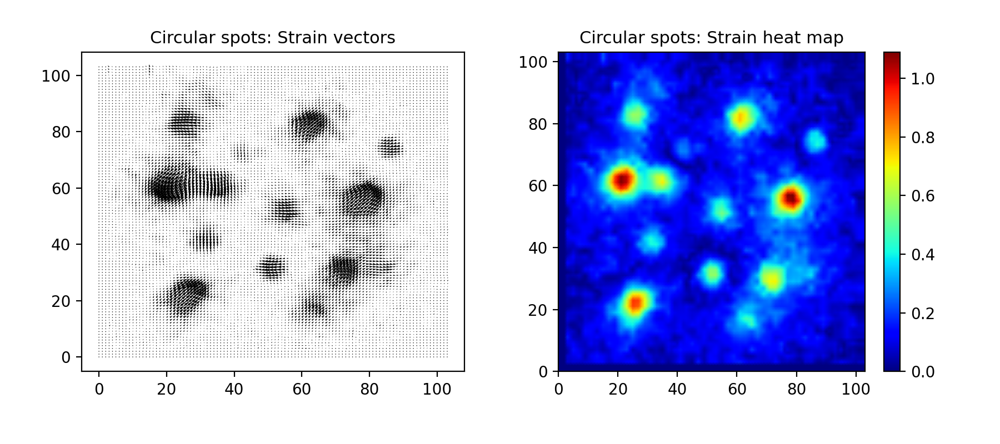

Text(0.5, 1.0, 'Circular spots: Strain heat map')

In [299]:
get_ipython().run_line_magic('matplotlib', 'notebook')

fig, axs = plt.subplots(1,2, figsize=(9, 4))
fig.tight_layout(pad=3, w_pad=3, h_pad=3)
axs[0].quiver(dspl_pad[:,:,0], dspl_pad[:,:,1], scale=35)
axs[0].set_title('Circular spots: Strain vectors', {'fontsize': 11})

C = np.sqrt(dspl_pad[:,:,0] ** 2 + dspl_pad[:,:,1] ** 2)
im = axs[1].pcolormesh(C, cmap='jet', shading='gouraud')
fig.colorbar(im, ax=axs[1])
axs[1].pcolormesh(C, cmap='jet', shading='gouraud')
axs[1].set_title('Circular spots: Strain heat map', {'fontsize': 11})

Predict traction fields for the Python-based TracNets and visualize the results.

In [300]:
predictions = {}
predictions['TracNet_SGD_Matlab'] = pred_trac_dltfm
predictions['TracNet_SGD_Python'] = np.moveaxis(predictTrac(torch.from_numpy(reshape(dspl_pad[np.newaxis, :])), model_SGD, E=10000).detach().numpy()[0][0], [0,2], [2,0])
predictions['TracNet_ADAM_Python'] = np.moveaxis(predictTrac(torch.from_numpy(reshape(dspl_pad[np.newaxis, :])), model_ADAM, E=10000).detach().numpy()[0][0], [0,2], [2,0])
predictions['Easy-to-use_TFM'] = pred_trac_etutfm

<IPython.core.display.Javascript object>


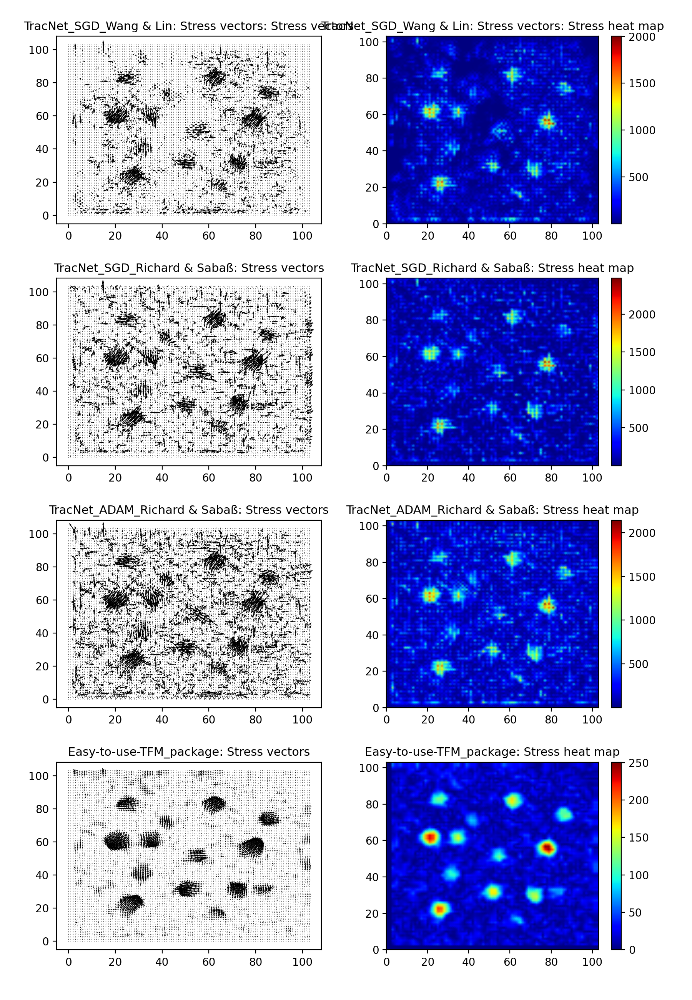

In [312]:
get_ipython().run_line_magic('matplotlib', 'notebook')

fig, axs = plt.subplots(4, 2, figsize=(9, 13))
fig.tight_layout(pad=3, w_pad=3, h_pad=3)

axs[0, 0].quiver(predictions['TracNet_SGD_Matlab'][:,:,0], predictions['TracNet_SGD_Matlab'][:,:,1], scale=30000)
axs[0, 0].set_title('TracNet_SGD_Wang & Lin: Stress vectors: Stress vectors', {'fontsize': 11})

C = np.sqrt(predictions['TracNet_SGD_Matlab'][:,:,0] ** 2 + predictions['TracNet_SGD_Matlab'][:,:,1] ** 2)
im = axs[0,1].pcolormesh(C, cmap='jet', shading='gouraud')
fig.colorbar(im, ax=axs[0,1])
axs[0,1].pcolormesh(C, cmap='jet', shading='gouraud')
axs[0,1].set_title('TracNet_SGD_Wang & Lin: Stress vectors: Stress heat map', {'fontsize': 11})

axs[1, 0].quiver(predictions['TracNet_SGD_Python'][:,:,0], predictions['TracNet_SGD_Python'][:,:,1], scale=30000)
axs[1, 0].set_title('TracNet_SGD_Richard & Sabaß: Stress vectors', {'fontsize': 11})

C = np.sqrt(predictions['TracNet_SGD_Python'][:,:,0] ** 2 + predictions['TracNet_SGD_Python'][:,:,1] ** 2)
im = axs[1,1].pcolormesh(C, cmap='jet', shading='gouraud')
fig.colorbar(im, ax=axs[1,1])
axs[1,1].pcolormesh(C, cmap='jet', shading='gouraud')
axs[1,1].set_title('TracNet_SGD_Richard & Sabaß: Stress heat map', {'fontsize': 11})

axs[2, 0].quiver(predictions['TracNet_ADAM_Python'][:,:,0], predictions['TracNet_ADAM_Python'][:,:,1], scale=30000)
axs[2, 0].set_title('TracNet_ADAM_Richard & Sabaß: Stress vectors', {'fontsize': 11})

C = np.sqrt(predictions['TracNet_ADAM_Python'][:,:,0] ** 2 + predictions['TracNet_ADAM_Python'][:,:,1] ** 2)
im = axs[2,1].pcolormesh(C, cmap='jet', shading='gouraud')
fig.colorbar(im, ax=axs[2,1])
axs[2,1].pcolormesh(C, cmap='jet', shading='gouraud')
axs[2,1].set_title('TracNet_ADAM_Richard & Sabaß: Stress heat map', {'fontsize': 11})

axs[3, 0].quiver(predictions['Easy-to-use_TFM'][:,:,0], predictions['Easy-to-use_TFM'][:,:,1], scale=5000)
axs[3, 0].set_title('Easy-to-use-TFM_package: Stress vectors', {'fontsize': 11})

C = np.sqrt(predictions['Easy-to-use_TFM'][:,:,0] ** 2 + predictions['Easy-to-use_TFM'][:,:,1] ** 2)
im = axs[3,1].pcolormesh(C, cmap='jet', shading='gouraud')
fig.colorbar(im, ax=axs[3,1])
axs[3,1].pcolormesh(C, cmap='jet', shading='gouraud')
axs[3,1].set_title('Easy-to-use-TFM_package: Stress heat map', {'fontsize': 11})

plt.show()

We can see that the neural networks are not able to reduce the noise in the prediction as they have been trained on 'clean' samples (i.e. without Gaussian noise). The numerical algorithm on the other hand is especially designed to regularize and suppress noise. This comes at the cost of coarse-grained predictions at the cell borders.

### To be done
- Evaluation on experimental data from AG Sabaß
- Evaluation of the Easy-to-use_TFM-package on artificial data from Wang & Lin
- Numerical evaluations in second and third experiment

In [308]:
def interpDspl(dspl, steps):
    '''
    Linearly interpolate a rectangular displacement field.
    '''
    size = dspl.shape[0]
    x, y = np.meshgrid(np.linspace(1, size, size), np.linspace(1, size, size))
    dspl_interp = np.zeros(shape=(new_size,new_size,2))
    
    f = interpolate.interp2d(x, y, dspl[:,:,0], kind='linear')
    g = interpolate.interp2d(x, y, dspl[:,:,1], kind='linear')
    dspl_interp[:,:,0] = f(np.linspace(1, size, steps), np.linspace(1, size, steps))
    dspl_interp[:,:,1] = f(np.linspace(1, size, steps), np.linspace(1, size, steps))
    
    return dspl_interp

In [ ]:
'''
dspl = np.zeros(shape=(50,50,2))
dspl[:,:,0] = np.reshape(dspl_[:,0],[50,50], order = 'C')
dspl[:,:,1] = np.reshape(dspl_[:,1],[50,50], order = 'C')

trac = np.zeros(shape=(50,50,2))
trac[:,:,0] = np.reshape(trac_[:,0],[50,50], order = 'C')
trac[:,:,1] = np.reshape(trac_[:,1],[50,50], order = 'C')
'''

In [ ]:
'''
distance_matrix = np.sqrt(circ_dspl[:,:,0] ** 2 + circ_dspl[:,:,1] ** 2)
i, j = np.unravel_index(distance_matrix.argmin(), distance_matrix.shape)
padded_demo_dspl = np.zeros(shape=(26,26,2))
padded_demo_dspl[:,:,0] = np.pad(demo_dspl[:,:,0], ((3, 2), (2, 3)), 'constant', constant_values=(demo_dspl[i][j][0], demo_dspl[i][j][0]))
padded_demo_dspl[:,:,1] = np.pad(demo_dspl[:,:,1], ((3, 2), (2, 3)), 'constant', constant_values=(demo_dspl[i][j][0], demo_dspl[i][j][0]))
'''